In [1]:
import pandas as pd
import numpy as np
import h5py
import datetime
import math
import matplotlib.pyplot as plt
from matplotlib.dates import DateFormatter
import seaborn as sns
from scipy.signal import savgol_filter
plt.style.use('seaborn')
%matplotlib inline


# White test blank spectra

In this notebook there are graphs of white test blank spectra.  The spectra included are (instrument, date of acquisition):.  

- FTIR engine 5/2/21
- Visible 5/2/21
- FTIR engine 4/30/21
- Visible 4/30/21
- FTIR engine 4/29/21
- Visible 4/29/21
- NIRONE 5/3/21
- NIRONE 5/2/21
- NIRONE 3/30/21
- NIRONE 4/10/21


In [2]:
def get_calibration_temperature(file, calibration_path):
    with h5py.File(file, 'r') as h5_file:
        cal_temp = h5_file[calibration_path].attrs['ftir_temperature']
        return cal_temp
    
def get_insertion_temperature(file, insertion_path):
    with h5py.File(file, 'r') as h5_file:
        ins_temp = h5_file[insertion_path].attrs['ftir_temp']
        return ins_temp
    
def get_visible_white_calibration_curve(file, calibration_path):
    with h5py.File(file, 'r') as h5_file:
        cal = h5_file[calibration_path].attrs['white_spectrum'][:]
        return cal
    
def get_ftir_white_calibration_curve(file, calibration_path):
    with h5py.File(file, 'r') as h5_file:
        cal = h5_file[calibration_path].attrs['white_spectrum2'][:]
        return cal
    
def get_visible_wavelength_vector(file, calibration_path):
    with h5py.File(file, 'r') as h5_file:
        waves = h5_file[calibration_path].attrs['spec1_wavelengths_vector'][:]
        return waves
    
def get_ftir_wavelength_vector(file, calibration_path):
    with h5py.File(file, 'r') as h5_file:
        waves = h5_file[calibration_path].attrs['spec2_wavelengths_vector'][:]
        return waves
    
def get_ftir_insertion_absorbances(file, insertion_path):
    with h5py.File(file, 'r') as h5_file:
        ins_abs = h5_file[f'{insertion_path}/spectrometer2/derived/absorbances'][:]
        return ins_abs
    
def get_ftir_insertion_raw_spectra(file, insertion_path):
    with h5py.File(file, 'r') as h5_file:
        ins_raw = h5_file[f'{insertion_path}/spectrometer2/spectra'][:]
        return ins_raw
    
def get_ftir_insertion_timestamps(file, insertion_path):
    with h5py.File(file, 'r') as h5_file:
        timestamps = h5_file[f'{insertion_path}/spectrometer2/timestamps'][:]
        return timestamps
    
def get_visible_insertion_timestamps(file, insertion_path):
    with h5py.File(file, 'r') as h5_file:
        timestamps = h5_file[f'{insertion_path}/spectrometer1/timestamps'][:]
        return timestamps
    
def get_visible_insertion_absorbances(file, insertion_path):
    with h5py.File(file, 'r') as h5_file:
        ins_abs = h5_file[f'{insertion_path}/spectrometer1/derived/absorbances'][:]
        return ins_abs
    
def get_visible_insertion_raw_spectra(file, insertion_path):
    with h5py.File(file, 'r') as h5_file:
        ins_raw = h5_file[f'{insertion_path}/spectrometer1/spectra'][:]
        return ins_raw
    
def create_list_of_items_in_node(item_type, file, node):
    with h5py.File(file, 'r') as h5_file:
        keys = []
        if item_type == "group":
            my_type = h5py._hl.group.Group
        if item_type == "dataset":
            my_type = h5py._hl.dataset.Dataset
        h5_file[node].visit(lambda key: keys.append(key) if type(h5_file[node][key]) is my_type else None)
        return keys

def create_list_of_calibrations_in_node(file, node):
    calibrations = []
    all_groups = create_list_of_items_in_node("group", file, node)
    for group in all_groups:
        if group[-6:-3] == 'cal':
            calibrations.append(node + '/' + group)
    return calibrations

def create_list_of_insertions_in_calibration(file, calibration_path):
    with h5py.File(file, 'r') as h5_file:
        insertion_keys = list(h5_file[calibration_path].keys())
        insertions = [f'{calibration_path}/{key}' for key in insertion_keys]            
        return insertions
    
def select_by_depth_range(df, range_start, range_end):
    df_out = df.loc[(df['depth'] > range_start) & (df['depth'] < range_end)]
    return df_out

def calculate_absorbance_from_raw(raw_spectrum, white_spectrum, dark_spectrum):
    reflectance = ((raw_spectrum - dark_spectrum) / (white_spectrum - dark_spectrum))
    inverse_reflectance = 1/reflectance
    absorbance = np.log10(inverse_reflectance.astype(np.float64))
    return absorbance

def calculate_absorbance_for_2D_array(array, white_spectrum, dark_spectrum):
    absorbance_array = np.empty_like(array, dtype=np.float64)
    for i in range(array.shape[0]):
        absorbance_spectrum = calculate_absorbance_from_raw(array[i, :], white_spectrum, dark_spectrum)
        absorbance_array[i, :] = absorbance_spectrum
    return absorbance_array

def construct_full_file_path(data_path, file_name):
    file_path = data_path + file_name
    return file_path

def create_list_of_sessions_in_file(file_name):
    sessions = []
    all_groups = create_list_of_items_in_node("group", file_name, "/")
    for group in all_groups:
        if (group[0:3] == 'ses') and (len(group) == 10):
            sessions.append(group)
    return sessions

def create_list_of_insertions_in_file(file_name):
    insertions = []
    sessions = create_list_of_sessions_in_file(file_name)
    for session in sessions:
        calibrations = create_list_of_calibrations_in_node(file_name, session)
        for calibration in calibrations:
            cal_insertions = create_list_of_insertions_in_calibration(file_name, calibration)
            for insertion in cal_insertions:
                insertions.append(insertion)
    return insertions
            
def get_insertion_timestamp(file, insertion_path):
    with h5py.File(file, 'r') as h5_file:
        ins_time = h5_file[insertion_path].attrs['start_time']
        ins_timestamp = pd.Timestamp(ins_time, unit='us')
        return ins_timestamp
    
def get_calibration_timestamp(file, calibration_path):
    with h5py.File(file, 'r') as h5_file:
        cal_time = h5_file[calibration_path].attrs['calibration_start_time']
        cal_timestamp = pd.Timestamp(cal_time, unit='us')
        return cal_timestamp  
    
def find_position_in_wavelength_vector(wavelength_vector, integer):
    position = np.where(np.isclose(wavelength_vector, integer, 1e-3))[0][0]
    return position

def normalize(value, max_value, min_value):
    normalized_value = (value - min_value)/(max_value - min_value)
    return normalized_value

def get_ftir_dark_calibration_curve(file, calibration_path):
    with h5py.File(file, 'r') as h5_file:
        cal = h5_file[calibration_path].attrs['dark_spectrum2'][:]
        return cal
    
def get_visible_dark_calibration_curve(file, calibration_path):
    with h5py.File(file, 'r') as h5_file:
        cal = h5_file[calibration_path].attrs['dark_spectrum'][:]
        return cal
        
def get_ftir_spectrum_timestamp(file, insertion_path, index):
    with h5py.File(file, 'r') as h5_file:
        time = h5_file[f'{insertion_path}/spectrometer2/timestamps'][index]
        timestamp = pd.Timestamp(time, unit='us')
        return timestamp
    
def get_visible_spectrum_timestamp(file, insertion_path, index):
    with h5py.File(file, 'r') as h5_file:
        time = h5_file[f'{insertion_path}/spectrometer1/timestamps'][index]
        timestamp = pd.Timestamp(time, unit='us')
        return timestamp
    
def compute_3D_distance(x1, y1, z1, x2, y2, z2):
    distance = math.sqrt((x1 - x2)**2 + (y1 - y2)**2 + (z1 - z2)**2)
    return distance

# FTIR engine absorbance spectra plots, 5/2/21

Spectra from calibration cal001 (insertions ins001-ins010) were taken inside the garage, during the time of lamp warmup.

Spectra from calibration cal002 (insertions ins011-ins020) were taken outside in the sunshine, on a bright sunny afternoon.

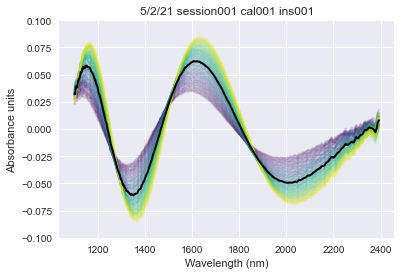

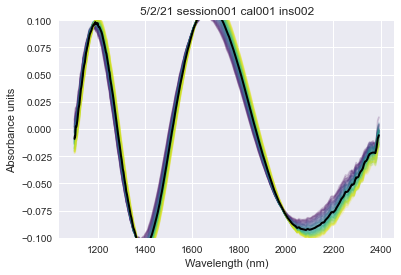

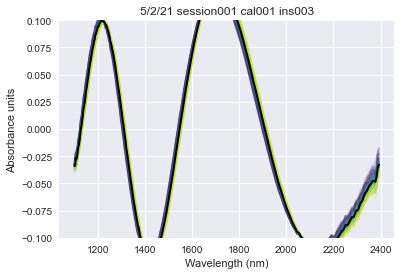

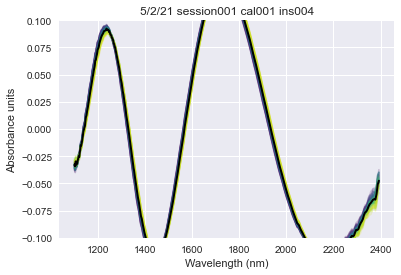

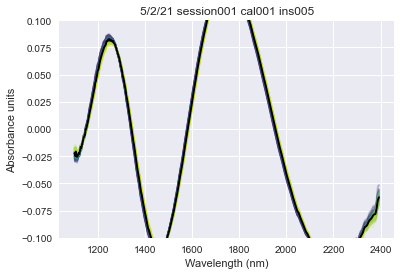

...

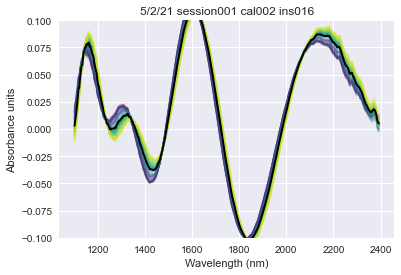

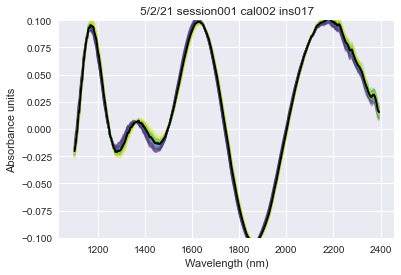

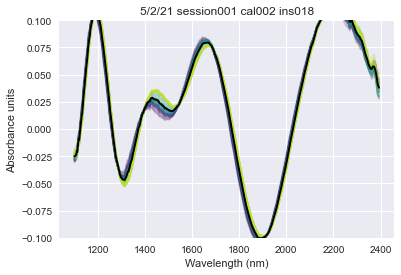

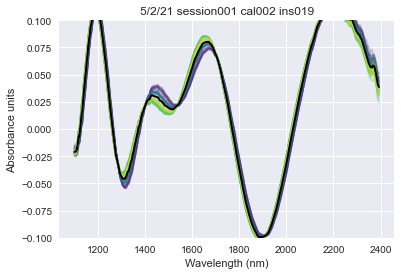

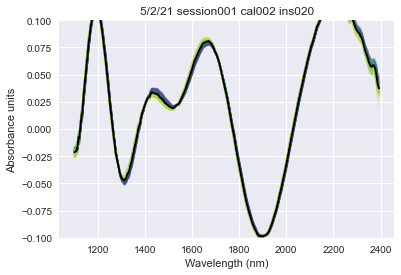

In [3]:
path_name = "/Users/linda/OneDrive/Documents/S4_mine_p/Projects/Data_collected/"

df = pd.read_csv('data/white_insertions_210503.csv')
date = '5/2/21'
session_df = df.loc[df['date'] == date].copy()

for calibration in session_df['calibration'].unique():
    small_df = session_df.loc[session_df['calibration'] == calibration].copy()
    for index in small_df.index:    
        file = construct_full_file_path(path_name, small_df['file_name'][index])
        session = small_df['session'][index]
        calibration_path = small_df['session'][index] + '/' + small_df['calibration'][index]
        insertion_path = calibration_path + '/' + small_df['insertion'][index]
        insertion = small_df['insertion'][index]
        insertion_start = get_insertion_timestamp(file, insertion_path)
        ftir_waves = get_ftir_wavelength_vector(file, calibration_path)
        start_index = find_position_in_wavelength_vector(ftir_waves, 1100)
        end_index = find_position_in_wavelength_vector(ftir_waves, 2400)
        ftir_raw_spectra = get_ftir_insertion_raw_spectra(file, insertion_path)
        absorbance_spectra = np.empty_like(ftir_raw_spectra[:, start_index:end_index], dtype=np.double)
        ftir_white_spectrum = get_ftir_white_calibration_curve(file, calibration_path)[start_index:end_index]
        ftir_dark_spectrum = get_ftir_dark_calibration_curve(file, calibration_path)[start_index:end_index]
        fig, ax = plt.subplots()
        first_timestamp = get_ftir_spectrum_timestamp(file, insertion_path, 0)
        insertion_df = pd.DataFrame()
        for i in range(ftir_raw_spectra.shape[0]):
            absorbance_spectrum = calculate_absorbance_from_raw(ftir_raw_spectra[i, start_index:end_index], ftir_white_spectrum, ftir_dark_spectrum)
            max_absorbance = abs(absorbance_spectrum.max())
            spectrum_timestamp = get_ftir_spectrum_timestamp(file, insertion_path, i)
            time_delta = spectrum_timestamp - first_timestamp
            insertion_df.loc[i, "time_delta"] = time_delta.total_seconds()
            insertion_df.loc[i, "max_absorbance"] = max_absorbance
            color = plt.cm.viridis(normalize(i, ftir_raw_spectra.shape[0], 0))
            absorbance_spectra[i, :] = absorbance_spectrum            
            
            ax.plot(ftir_waves[start_index:end_index], absorbance_spectrum, color=color, alpha=0.2)
        ax.plot(ftir_waves[start_index:end_index], absorbance_spectra.mean(axis=0), 'k', lw=2)
        ax.set_title(f'{date} {session} {calibration} {insertion}')
        ax.set_ylabel("Absorbance units")
        ax.set_xlabel("Wavelength (nm)")
        ax.set_ylim(-0.1, 0.1)
        plt.show()
        plt.close()

# Visible spectrometer absorbance spectra plots, 5/2/21

Spectra from calibration cal001 (insertions ins001-ins010) were taken inside the garage, during the time of lamp warmup.

Spectra from calibration cal002 (insertions ins011-ins020) were taken outside in the sunshine, on a bright sunny afternoon.

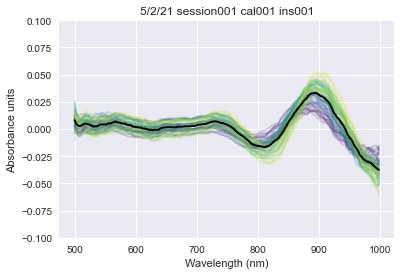

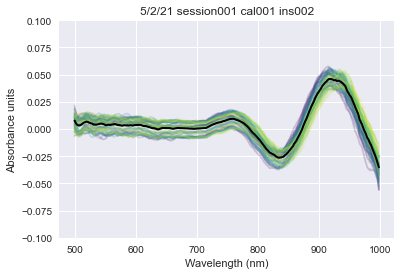

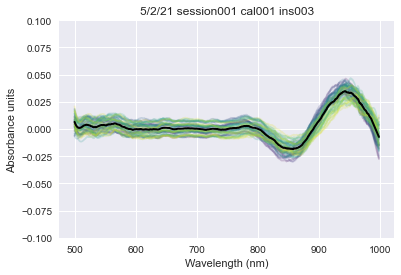

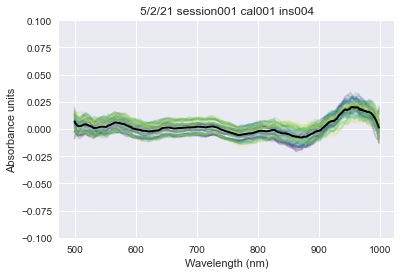

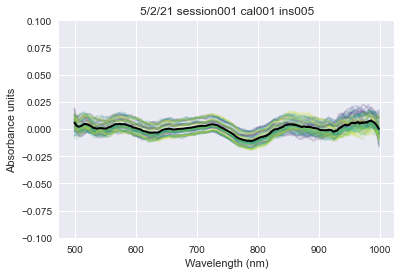

...

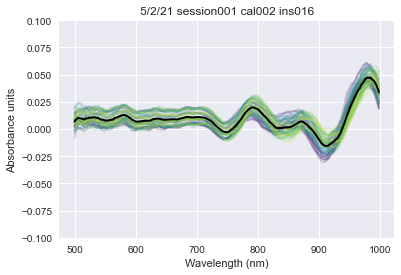

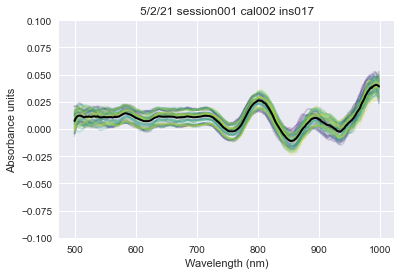

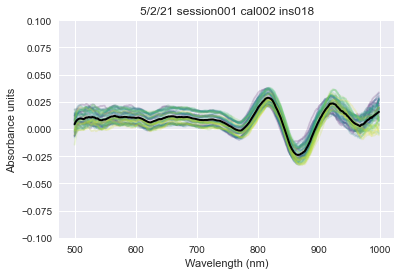

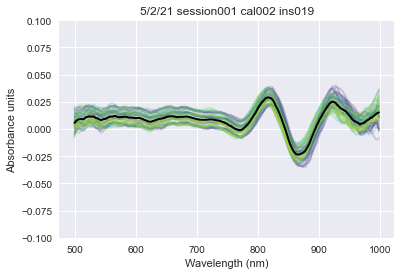

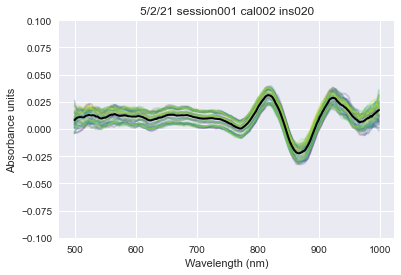

In [4]:
path_name = "/Users/linda/OneDrive/Documents/S4_mine_p/Projects/Data_collected/"

df = pd.read_csv('data/white_insertions_210503.csv')
date = '5/2/21'
session_df = df.loc[df['date'] == date].copy()

for calibration in session_df['calibration'].unique():
    small_df = session_df.loc[session_df['calibration'] == calibration].copy()
    for index in small_df.index:    
        file = construct_full_file_path(path_name, small_df['file_name'][index])
        session = small_df['session'][index]
        calibration_path = small_df['session'][index] + '/' + small_df['calibration'][index]
        insertion_path = calibration_path + '/' + small_df['insertion'][index]
        insertion = small_df['insertion'][index]
        insertion_start = get_insertion_timestamp(file, insertion_path)
        vis_waves = get_visible_wavelength_vector(file, calibration_path)
        start_index = find_position_in_wavelength_vector(vis_waves, 500)
        end_index = find_position_in_wavelength_vector(vis_waves, 1000)
        vis_raw_spectra = get_visible_insertion_raw_spectra(file, insertion_path)
        absorbance_spectra = np.empty_like(vis_raw_spectra[:, start_index:end_index], dtype=np.double)
        vis_white_spectrum = get_visible_white_calibration_curve(file, calibration_path)[start_index:end_index]
        vis_dark_spectrum = get_visible_dark_calibration_curve(file, calibration_path)[start_index:end_index]
        fig, ax = plt.subplots()
        first_timestamp = get_visible_spectrum_timestamp(file, insertion_path, 0)
        insertion_df = pd.DataFrame()
        for i in range(vis_raw_spectra.shape[0]):
            absorbance_spectrum = savgol_filter(calculate_absorbance_from_raw(vis_raw_spectra[i, start_index:end_index], vis_white_spectrum, vis_dark_spectrum), 21, 3)
            max_absorbance = abs(absorbance_spectrum.max())
            spectrum_timestamp = get_visible_spectrum_timestamp(file, insertion_path, i)
            time_delta = spectrum_timestamp - first_timestamp
            insertion_df.loc[i, "time_delta"] = time_delta.total_seconds()
            insertion_df.loc[i, "max_absorbance"] = max_absorbance
            absorbance_spectra[i, :] = absorbance_spectrum
            color = plt.cm.viridis(normalize(i, vis_raw_spectra.shape[0], 0))
            
            ax.plot(vis_waves[start_index:end_index], absorbance_spectrum, color=color, alpha=0.2)
        ax.plot(vis_waves[start_index:end_index], absorbance_spectra.mean(axis=0), 'k', lw=2)
        ax.set_title(f'{date} {session} {calibration} {insertion}')
        ax.set_ylabel("Absorbance units")
        ax.set_xlabel("Wavelength (nm)")
        ax.set_ylim(-0.1, 0.1)
        plt.show()
        plt.close()

# FTIR engine absorbance spectra plots, 4/30/21 

Spectra from calibration cal001 (insertions ins001-ins010) were taken outside with the lamp warming.

Spectra from calibration cal002 and cal003 (insertions ins011-ins030) were taken outside in the morning, before the sun hit the location where the instrument was set.

Spectra from calibration cal004 (insertions ins031-ins040) were taken in the sunshine.

Spectra from calibration cal005 (insertions ins041-050) were taken in the sunshine with a fan blowing on the light source (but the day was quite windy as well).

Spectra from calibration cal006 (insertions ins051-ins057) were taken in increasing cloudiness, with a fan blowing on the light source.  It began to rain at towards the end of this calibration.

Spectra from session003/ calibration cal001 (insertions ins001-ins010) were taken inside the garage, immediately after the previous ones. (These are shown after the second code block.)

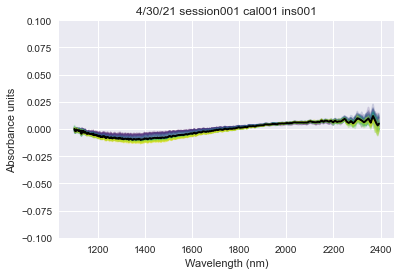

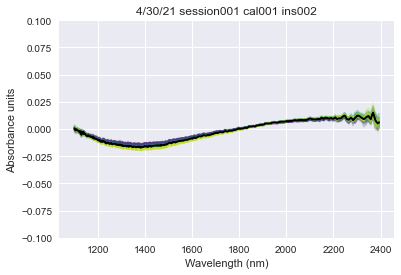

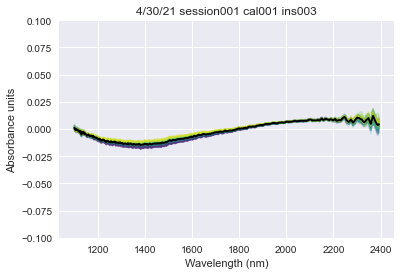

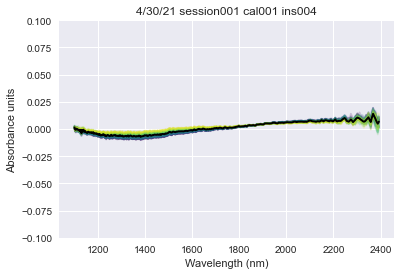

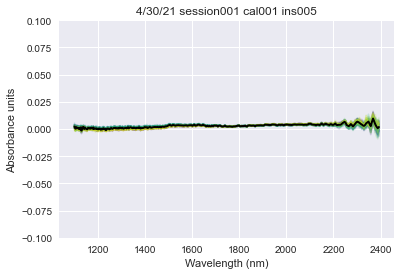

...

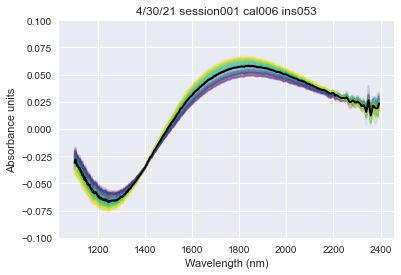

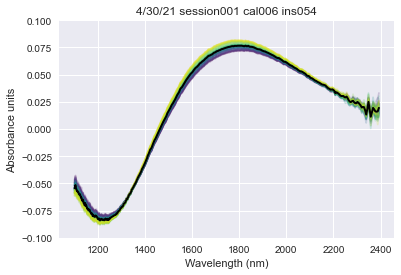

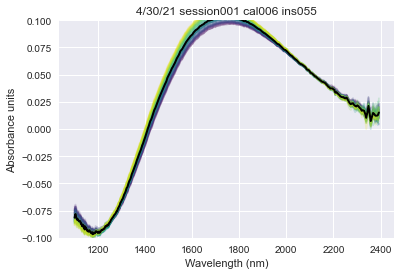

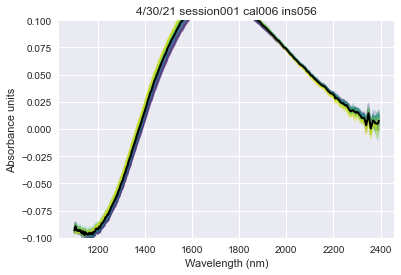

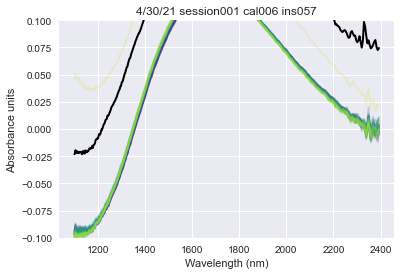

In [5]:
path_name = "/Users/linda/OneDrive/Documents/S4_mine_p/Projects/Data_collected/"

df = pd.read_csv('data/white_insertions_210503.csv')
date = '4/30/21'
session = 'session001'
session_df = df.loc[(df['date'] == date) & (df['session'] == session)].copy()

for calibration in session_df['calibration'].unique():
    small_df = session_df.loc[session_df['calibration'] == calibration].copy()
    for index in small_df.index:    
        file = construct_full_file_path(path_name, small_df['file_name'][index])
        session = small_df['session'][index]
        calibration_path = small_df['session'][index] + '/' + small_df['calibration'][index]
        insertion_path = calibration_path + '/' + small_df['insertion'][index]
        insertion = small_df['insertion'][index]
        insertion_start = get_insertion_timestamp(file, insertion_path)
        ftir_waves = get_ftir_wavelength_vector(file, calibration_path)
        start_index = find_position_in_wavelength_vector(ftir_waves, 1100)
        end_index = find_position_in_wavelength_vector(ftir_waves, 2400)
        ftir_raw_spectra = get_ftir_insertion_raw_spectra(file, insertion_path)
        absorbance_spectra = np.empty_like(ftir_raw_spectra[:, start_index:end_index], dtype=np.double)
        ftir_white_spectrum = get_ftir_white_calibration_curve(file, calibration_path)[start_index:end_index]
        ftir_dark_spectrum = get_ftir_dark_calibration_curve(file, calibration_path)[start_index:end_index]
        fig, ax = plt.subplots()
        first_timestamp = get_ftir_spectrum_timestamp(file, insertion_path, 0)
        insertion_df = pd.DataFrame()
        for i in range(ftir_raw_spectra.shape[0]):
            absorbance_spectrum = calculate_absorbance_from_raw(ftir_raw_spectra[i, start_index:end_index], ftir_white_spectrum, ftir_dark_spectrum)
            max_absorbance = abs(absorbance_spectrum.max())
            spectrum_timestamp = get_ftir_spectrum_timestamp(file, insertion_path, i)
            time_delta = spectrum_timestamp - first_timestamp
            insertion_df.loc[i, "time_delta"] = time_delta.total_seconds()
            insertion_df.loc[i, "max_absorbance"] = max_absorbance
            color = plt.cm.viridis(normalize(i, ftir_raw_spectra.shape[0], 0))
            absorbance_spectra[i, :] = absorbance_spectrum            
            
            ax.plot(ftir_waves[start_index:end_index], absorbance_spectrum, color=color, alpha=0.2)
        ax.plot(ftir_waves[start_index:end_index], absorbance_spectra.mean(axis=0), 'k', lw=2)
        ax.set_title(f'{date} {session} {calibration} {insertion}')
        ax.set_ylabel("Absorbance units")
        ax.set_xlabel("Wavelength (nm)")
        ax.set_ylim(-0.1, 0.1)
        plt.show()
        plt.close()
        


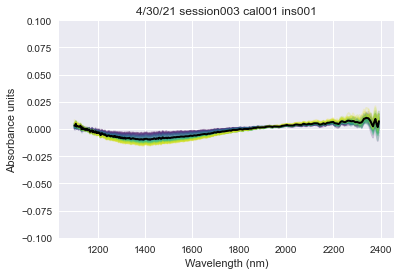

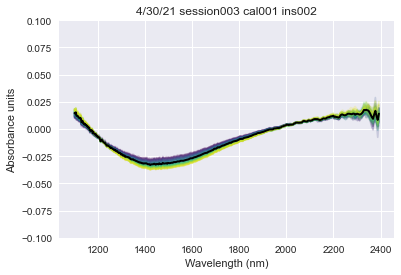

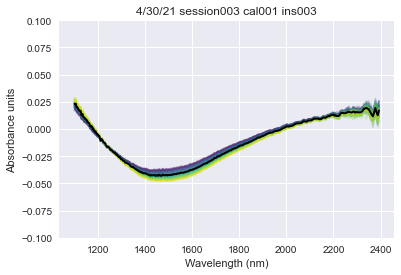

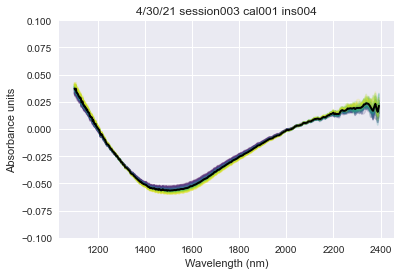

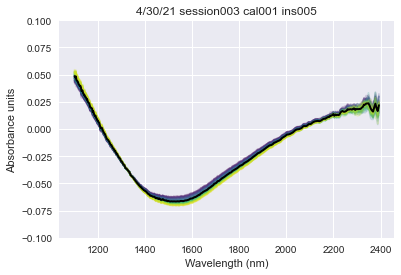

...

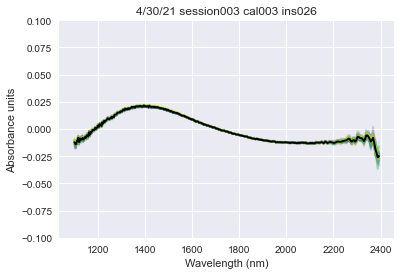

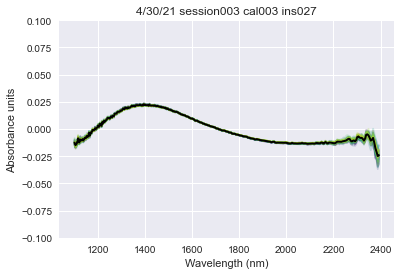

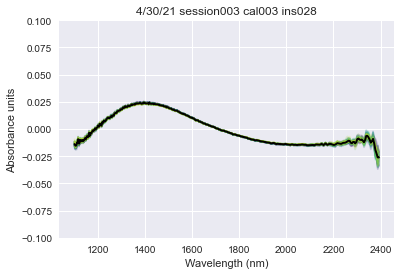

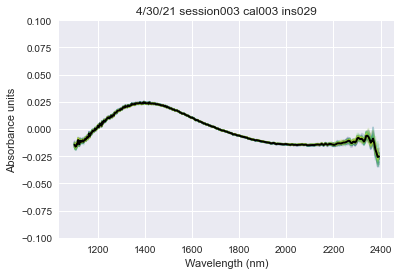

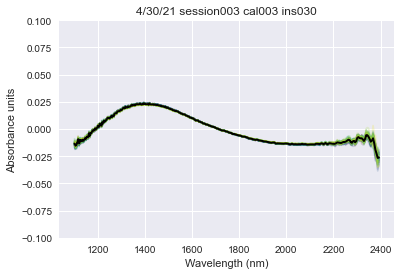

In [6]:
df = pd.read_csv('data/white_insertions_210503.csv')
date = '4/30/21'
session = 'session003'
session_df = df.loc[(df['date'] == date) & (df['session'] == session)].copy()

for calibration in session_df['calibration'].unique():
    small_df = session_df.loc[session_df['calibration'] == calibration].copy()
    for index in small_df.index:    
        file = construct_full_file_path(path_name, small_df['file_name'][index])
        session = small_df['session'][index]
        calibration_path = small_df['session'][index] + '/' + small_df['calibration'][index]
        insertion_path = calibration_path + '/' + small_df['insertion'][index]
        insertion = small_df['insertion'][index]
        insertion_start = get_insertion_timestamp(file, insertion_path)
        ftir_waves = get_ftir_wavelength_vector(file, calibration_path)
        start_index = find_position_in_wavelength_vector(ftir_waves, 1100)
        end_index = find_position_in_wavelength_vector(ftir_waves, 2400)
        ftir_raw_spectra = get_ftir_insertion_raw_spectra(file, insertion_path)
        absorbance_spectra = np.empty_like(ftir_raw_spectra[:, start_index:end_index], dtype=np.double)
        ftir_white_spectrum = get_ftir_white_calibration_curve(file, calibration_path)[start_index:end_index]
        ftir_dark_spectrum = get_ftir_dark_calibration_curve(file, calibration_path)[start_index:end_index]
        fig, ax = plt.subplots()
        first_timestamp = get_ftir_spectrum_timestamp(file, insertion_path, 0)
        insertion_df = pd.DataFrame()
        for i in range(ftir_raw_spectra.shape[0]):
            absorbance_spectrum = calculate_absorbance_from_raw(ftir_raw_spectra[i, start_index:end_index], ftir_white_spectrum, ftir_dark_spectrum)
            max_absorbance = abs(absorbance_spectrum.max())
            spectrum_timestamp = get_ftir_spectrum_timestamp(file, insertion_path, i)
            time_delta = spectrum_timestamp - first_timestamp
            insertion_df.loc[i, "time_delta"] = time_delta.total_seconds()
            insertion_df.loc[i, "max_absorbance"] = max_absorbance
            color = plt.cm.viridis(normalize(i, ftir_raw_spectra.shape[0], 0))
            absorbance_spectra[i, :] = absorbance_spectrum            
            
            ax.plot(ftir_waves[start_index:end_index], absorbance_spectrum, color=color, alpha=0.2)
        ax.plot(ftir_waves[start_index:end_index], absorbance_spectra.mean(axis=0), 'k', lw=2)
        ax.set_title(f'{date} {session} {calibration} {insertion}')
        ax.set_ylabel("Absorbance units")
        ax.set_xlabel("Wavelength (nm)")
        ax.set_ylim(-0.1, 0.1)
        plt.show()
        plt.close()

# Visible spectrometer absorbance spectra plots, 4/30/21

Spectra from calibration cal001 (insertions ins001-ins010) were taken outside with the lamp warming.

Spectra from calibration cal002 and cal003 (insertions ins011-ins030) were taken outside in the morning, before the sun hit the location where the instrument was set.

Spectra from calibration cal004 (insertions ins031-ins040) were taken in the sunshine.

Spectra from calibration cal005 (insertions ins041-050) were taken in the sunshine with a fan blowing on the light source (but the day was quite windy as well).

Spectra from calibration cal006 (insertions ins051-ins057) were taken in increasing cloudiness, with a fan blowing on the light source. It began to rain at towards the end of this calibration.

Spectra from session003/ calibration cal001 (insertions ins001-ins010) were taken inside the garage, immediately after the previous ones. (These are shown after the second code block.)

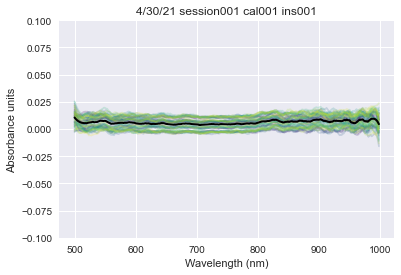

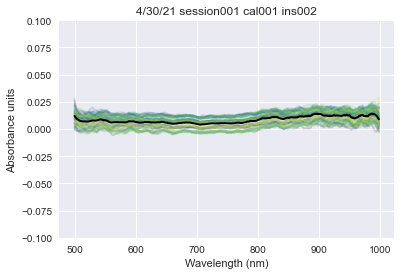

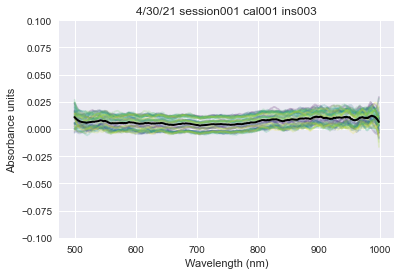

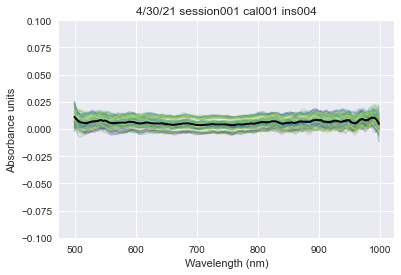

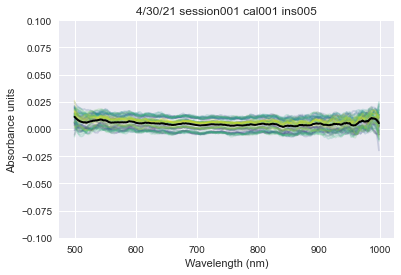

...

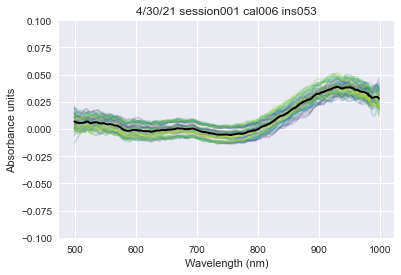

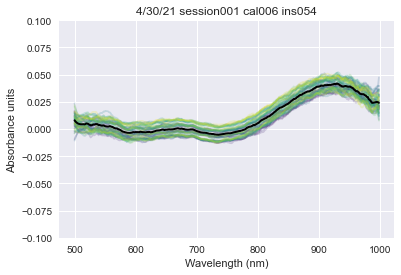

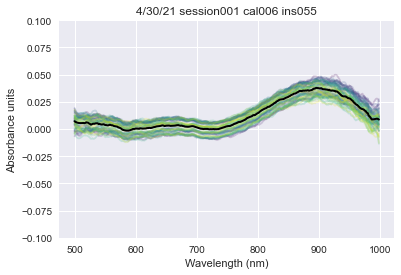

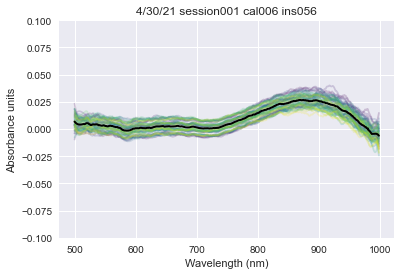

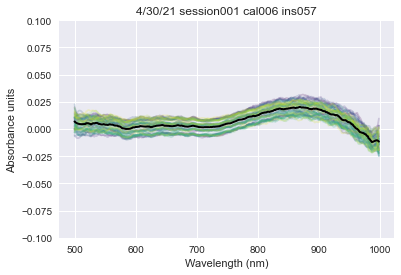

In [7]:
path_name = "/Users/linda/OneDrive/Documents/S4_mine_p/Projects/Data_collected/"

df = pd.read_csv('data/white_insertions_210503.csv')
date = '4/30/21'
session = 'session001'
session_df = df.loc[(df['date'] == date) & (df['session'] == session)].copy()

for calibration in session_df['calibration'].unique():
    small_df = session_df.loc[session_df['calibration'] == calibration].copy()
    for index in small_df.index:    
        file = construct_full_file_path(path_name, small_df['file_name'][index])
        session = small_df['session'][index]
        calibration_path = small_df['session'][index] + '/' + small_df['calibration'][index]
        insertion_path = calibration_path + '/' + small_df['insertion'][index]
        insertion = small_df['insertion'][index]
        insertion_start = get_insertion_timestamp(file, insertion_path)
        vis_waves = get_visible_wavelength_vector(file, calibration_path)
        start_index = find_position_in_wavelength_vector(vis_waves, 500)
        end_index = find_position_in_wavelength_vector(vis_waves, 1000)
        vis_raw_spectra = get_visible_insertion_raw_spectra(file, insertion_path)
        absorbance_spectra = np.empty_like(vis_raw_spectra[:, start_index:end_index], dtype=np.double)
        vis_white_spectrum = get_visible_white_calibration_curve(file, calibration_path)[start_index:end_index]
        vis_dark_spectrum = get_visible_dark_calibration_curve(file, calibration_path)[start_index:end_index]
        fig, ax = plt.subplots()
        first_timestamp = get_visible_spectrum_timestamp(file, insertion_path, 0)
        insertion_df = pd.DataFrame()
        for i in range(vis_raw_spectra.shape[0]):
            absorbance_spectrum = savgol_filter(calculate_absorbance_from_raw(vis_raw_spectra[i, start_index:end_index], vis_white_spectrum, vis_dark_spectrum), 21, 3)
            max_absorbance = abs(absorbance_spectrum.max())
            spectrum_timestamp = get_visible_spectrum_timestamp(file, insertion_path, i)
            time_delta = spectrum_timestamp - first_timestamp
            insertion_df.loc[i, "time_delta"] = time_delta.total_seconds()
            insertion_df.loc[i, "max_absorbance"] = max_absorbance
            absorbance_spectra[i, :] = absorbance_spectrum
            color = plt.cm.viridis(normalize(i, vis_raw_spectra.shape[0], 0))
            
            ax.plot(vis_waves[start_index:end_index], absorbance_spectrum, color=color, alpha=0.2)
        ax.plot(vis_waves[start_index:end_index], absorbance_spectra.mean(axis=0), 'k', lw=2)
        ax.set_title(f'{date} {session} {calibration} {insertion}')
        ax.set_ylabel("Absorbance units")
        ax.set_xlabel("Wavelength (nm)")
        ax.set_ylim(-0.1, 0.1)
        plt.show()
        plt.close()

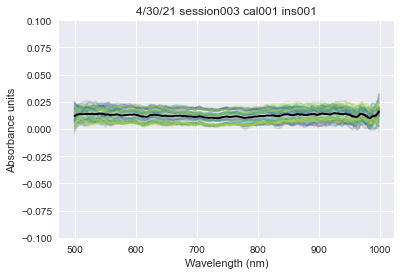

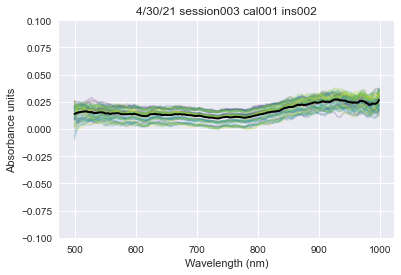

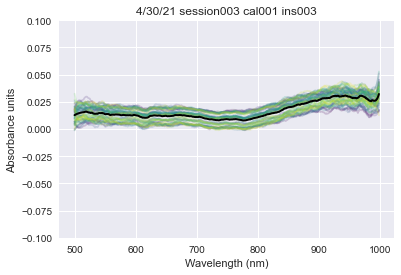

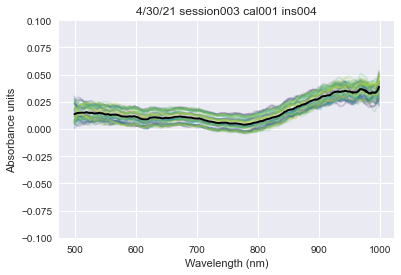

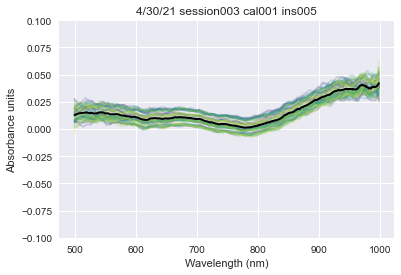

...

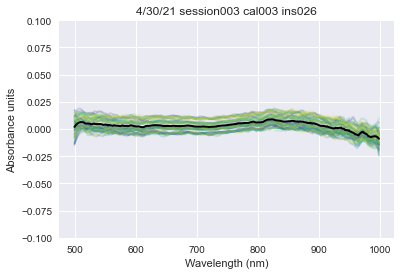

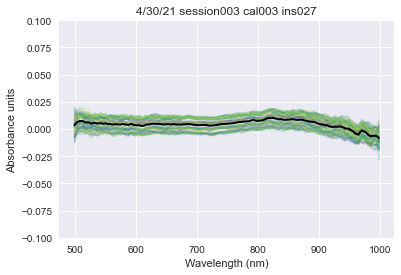

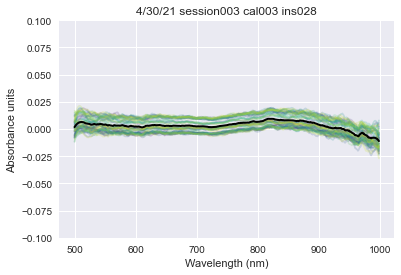

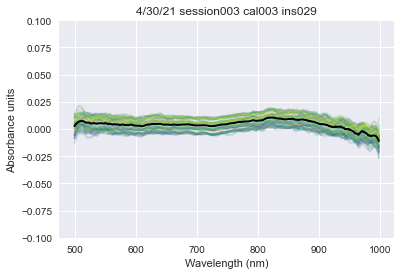

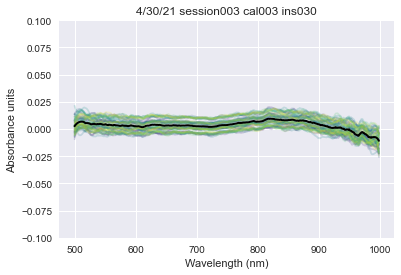

In [8]:
df = pd.read_csv('data/white_insertions_210503.csv')
date = '4/30/21'
session = 'session003'
session_df = df.loc[(df['date'] == date) & (df['session'] == session)].copy()

for calibration in session_df['calibration'].unique():
    small_df = session_df.loc[session_df['calibration'] == calibration].copy()
    for index in small_df.index:    
        file = construct_full_file_path(path_name, small_df['file_name'][index])
        session = small_df['session'][index]
        calibration_path = small_df['session'][index] + '/' + small_df['calibration'][index]
        insertion_path = calibration_path + '/' + small_df['insertion'][index]
        insertion = small_df['insertion'][index]
        insertion_start = get_insertion_timestamp(file, insertion_path)
        vis_waves = get_visible_wavelength_vector(file, calibration_path)
        start_index = find_position_in_wavelength_vector(vis_waves, 500)
        end_index = find_position_in_wavelength_vector(vis_waves, 1000)
        vis_raw_spectra = get_visible_insertion_raw_spectra(file, insertion_path)
        absorbance_spectra = np.empty_like(vis_raw_spectra[:, start_index:end_index], dtype=np.double)
        vis_white_spectrum = get_visible_white_calibration_curve(file, calibration_path)[start_index:end_index]
        vis_dark_spectrum = get_visible_dark_calibration_curve(file, calibration_path)[start_index:end_index]
        fig, ax = plt.subplots()
        first_timestamp = get_visible_spectrum_timestamp(file, insertion_path, 0)
        insertion_df = pd.DataFrame()
        for i in range(vis_raw_spectra.shape[0]):
            absorbance_spectrum = savgol_filter(calculate_absorbance_from_raw(vis_raw_spectra[i, start_index:end_index], vis_white_spectrum, vis_dark_spectrum), 21, 3)
            max_absorbance = abs(absorbance_spectrum.max())
            spectrum_timestamp = get_visible_spectrum_timestamp(file, insertion_path, i)
            time_delta = spectrum_timestamp - first_timestamp
            insertion_df.loc[i, "time_delta"] = time_delta.total_seconds()
            insertion_df.loc[i, "max_absorbance"] = max_absorbance
            absorbance_spectra[i, :] = absorbance_spectrum
            color = plt.cm.viridis(normalize(i, vis_raw_spectra.shape[0], 0))
            
            ax.plot(vis_waves[start_index:end_index], absorbance_spectrum, color=color, alpha=0.2)
        ax.plot(vis_waves[start_index:end_index], absorbance_spectra.mean(axis=0), 'k', lw=2)
        ax.set_title(f'{date} {session} {calibration} {insertion}')
        ax.set_ylabel("Absorbance units")
        ax.set_xlabel("Wavelength (nm)")
        ax.set_ylim(-0.1, 0.1)
        plt.show()
        plt.close()

# Ftir engine absorbance spectra, 4/29/21

- cal001:  collected immeditately after turning on the light source
- cal002:  collected inside
- cal003:  collected with a box on the light source in the garage
- cal004:  collected with a box on the light source in the garage
- cal005:  collected inside, no box on the light source
- cal006:  collected with a fan blowing on the light source
- cal007:  collected with a fan blowing on the light source
- cal008:  collected inside, no fan on the light source

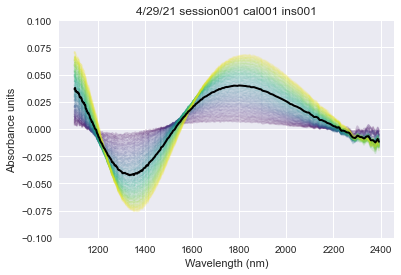

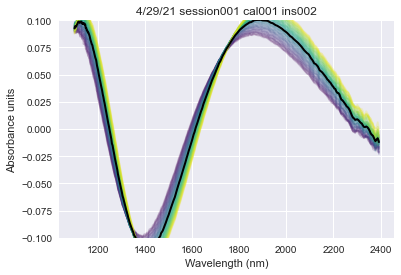

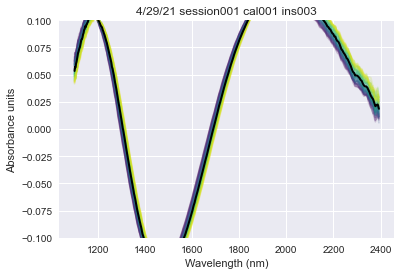

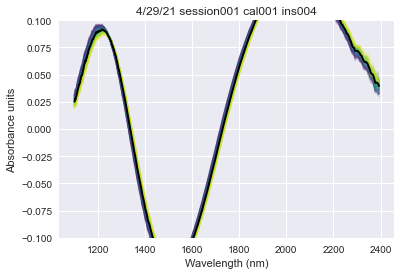

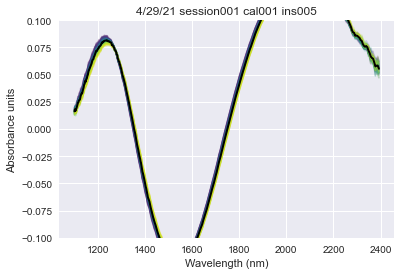

...

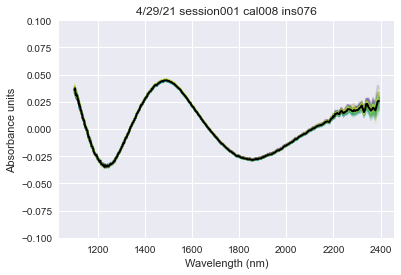

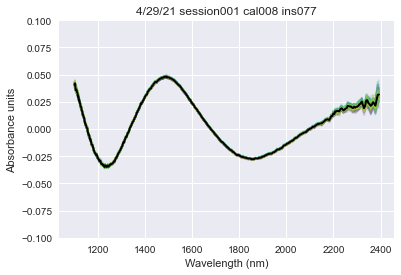

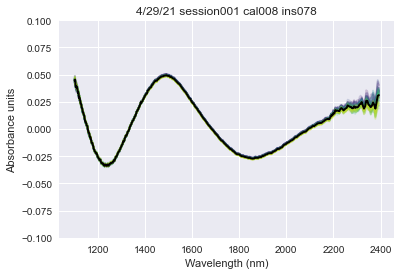

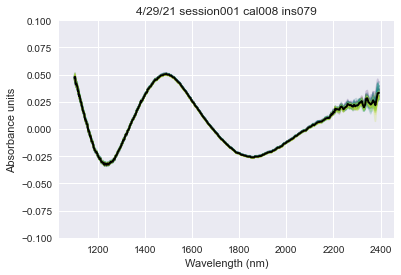

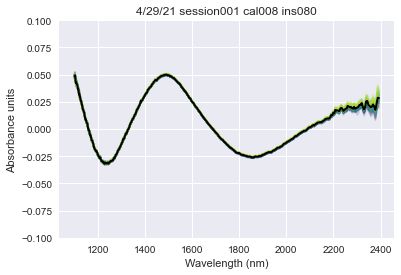

In [9]:
path_name = "/Users/linda/OneDrive/Documents/S4_mine_p/Projects/Data_collected/"

df = pd.read_csv('data/white_insertions_210503.csv')
date = '4/29/21'
session_df = df.loc[df['date'] == date].copy()

for calibration in session_df['calibration'].unique():
    small_df = session_df.loc[session_df['calibration'] == calibration].copy()
    for index in small_df.index:    
        file = construct_full_file_path(path_name, small_df['file_name'][index])
        session = small_df['session'][index]
        calibration_path = small_df['session'][index] + '/' + small_df['calibration'][index]
        insertion_path = calibration_path + '/' + small_df['insertion'][index]
        insertion = small_df['insertion'][index]
        insertion_start = get_insertion_timestamp(file, insertion_path)
        ftir_waves = get_ftir_wavelength_vector(file, calibration_path)
        start_index = find_position_in_wavelength_vector(ftir_waves, 1100)
        end_index = find_position_in_wavelength_vector(ftir_waves, 2400)
        ftir_raw_spectra = get_ftir_insertion_raw_spectra(file, insertion_path)
        absorbance_spectra = np.empty_like(ftir_raw_spectra[:, start_index:end_index], dtype=np.double)
        ftir_white_spectrum = get_ftir_white_calibration_curve(file, calibration_path)[start_index:end_index]
        ftir_dark_spectrum = get_ftir_dark_calibration_curve(file, calibration_path)[start_index:end_index]
        fig, ax = plt.subplots()
        first_timestamp = get_ftir_spectrum_timestamp(file, insertion_path, 0)
        insertion_df = pd.DataFrame()
        for i in range(ftir_raw_spectra.shape[0]):
            absorbance_spectrum = calculate_absorbance_from_raw(ftir_raw_spectra[i, start_index:end_index], ftir_white_spectrum, ftir_dark_spectrum)
            max_absorbance = abs(absorbance_spectrum.max())
            spectrum_timestamp = get_ftir_spectrum_timestamp(file, insertion_path, i)
            time_delta = spectrum_timestamp - first_timestamp
            insertion_df.loc[i, "time_delta"] = time_delta.total_seconds()
            insertion_df.loc[i, "max_absorbance"] = max_absorbance
            color = plt.cm.viridis(normalize(i, ftir_raw_spectra.shape[0], 0))
            absorbance_spectra[i, :] = absorbance_spectrum            
            
            ax.plot(ftir_waves[start_index:end_index], absorbance_spectrum, color=color, alpha=0.2)
        ax.plot(ftir_waves[start_index:end_index], absorbance_spectra.mean(axis=0), 'k', lw=2)
        ax.set_title(f'{date} {session} {calibration} {insertion}')
        ax.set_ylabel("Absorbance units")
        ax.set_xlabel("Wavelength (nm)")
        ax.set_ylim(-0.1, 0.1)
        plt.show()
        plt.close()

# Visible spectrometer absorbance spectra, 4/29/21

- cal001:  collected immeditately after turning on the light source
- cal002:  collected inside
- cal003:  collected with a box on the light source in the garage
- cal004:  collected with a box on the light source in the garage
- cal005:  collected inside, no box on the light source
- cal006:  collected with a fan blowing on the light source
- cal007:  collected with a fan blowing on the light source
- cal008:  collected inside, no fan on the light source

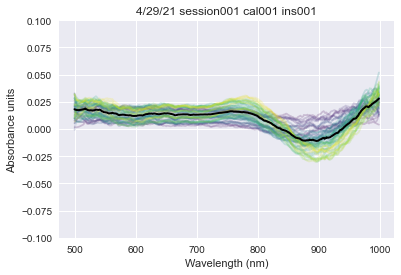

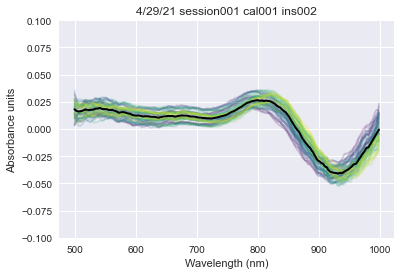

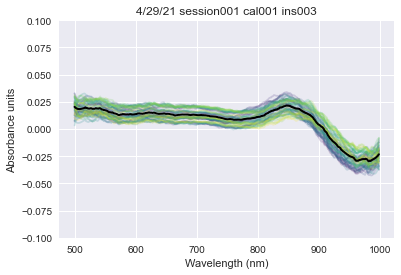

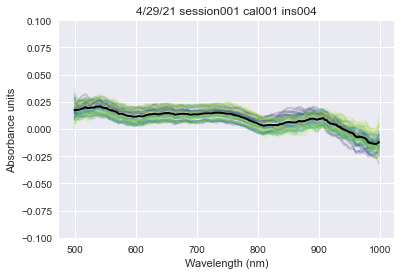

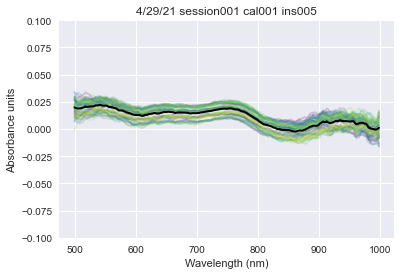

...

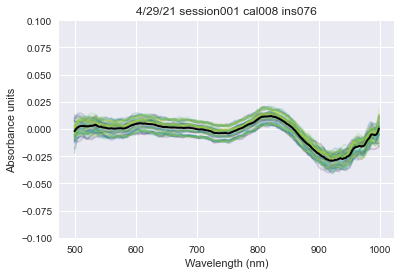

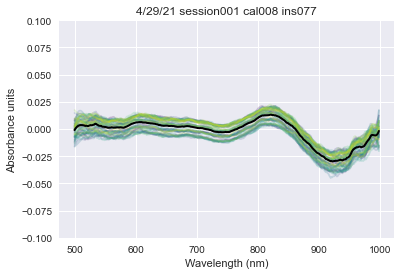

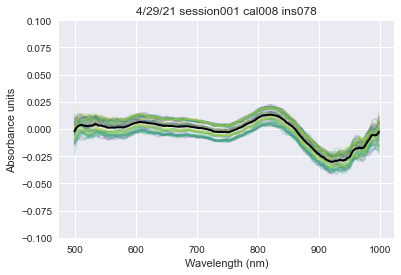

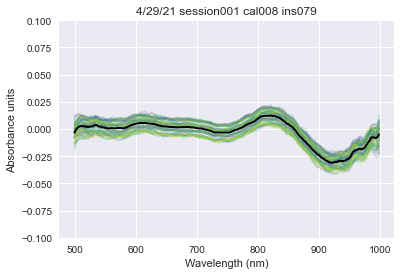

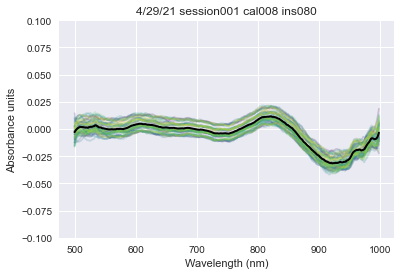

In [10]:
path_name = "/Users/linda/OneDrive/Documents/S4_mine_p/Projects/Data_collected/"

df = pd.read_csv('data/white_insertions_210503.csv')
date = '4/29/21'
session_df = df.loc[df['date'] == date].copy()

for calibration in session_df['calibration'].unique():
    small_df = session_df.loc[session_df['calibration'] == calibration].copy()
    for index in small_df.index:    
        file = construct_full_file_path(path_name, small_df['file_name'][index])
        session = small_df['session'][index]
        calibration_path = small_df['session'][index] + '/' + small_df['calibration'][index]
        insertion_path = calibration_path + '/' + small_df['insertion'][index]
        insertion = small_df['insertion'][index]
        insertion_start = get_insertion_timestamp(file, insertion_path)
        vis_waves = get_visible_wavelength_vector(file, calibration_path)
        start_index = find_position_in_wavelength_vector(vis_waves, 500)
        end_index = find_position_in_wavelength_vector(vis_waves, 1000)
        vis_raw_spectra = get_visible_insertion_raw_spectra(file, insertion_path)
        absorbance_spectra = np.empty_like(vis_raw_spectra[:, start_index:end_index], dtype=np.double)
        vis_white_spectrum = get_visible_white_calibration_curve(file, calibration_path)[start_index:end_index]
        vis_dark_spectrum = get_visible_dark_calibration_curve(file, calibration_path)[start_index:end_index]
        fig, ax = plt.subplots()
        first_timestamp = get_visible_spectrum_timestamp(file, insertion_path, 0)
        insertion_df = pd.DataFrame()
        for i in range(vis_raw_spectra.shape[0]):
            absorbance_spectrum = savgol_filter(calculate_absorbance_from_raw(vis_raw_spectra[i, start_index:end_index], vis_white_spectrum, vis_dark_spectrum), 21, 3)
            max_absorbance = abs(absorbance_spectrum.max())
            spectrum_timestamp = get_visible_spectrum_timestamp(file, insertion_path, i)
            time_delta = spectrum_timestamp - first_timestamp
            insertion_df.loc[i, "time_delta"] = time_delta.total_seconds()
            insertion_df.loc[i, "max_absorbance"] = max_absorbance
            absorbance_spectra[i, :] = absorbance_spectrum
            color = plt.cm.viridis(normalize(i, vis_raw_spectra.shape[0], 0))
            
            ax.plot(vis_waves[start_index:end_index], absorbance_spectrum, color=color, alpha=0.2)
        ax.plot(vis_waves[start_index:end_index], absorbance_spectra.mean(axis=0), 'k', lw=2)
        ax.set_title(f'{date} {session} {calibration} {insertion}')
        ax.set_ylabel("Absorbance units")
        ax.set_xlabel("Wavelength (nm)")
        ax.set_ylim(-0.1, 0.1)
        plt.show()
        plt.close()

# NIRONE absorbance spectra, 5/3/21

Spectra were taken inside the garage, beginning immediately after turning on the light source.

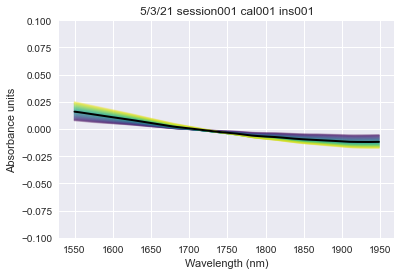

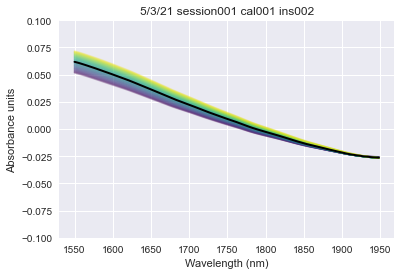

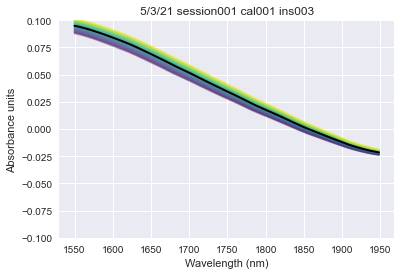

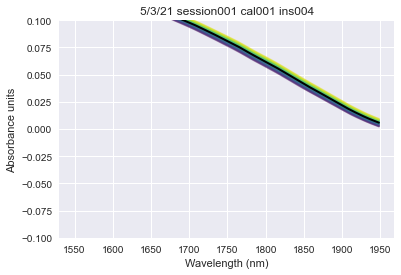

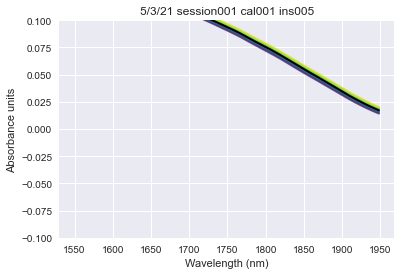

...

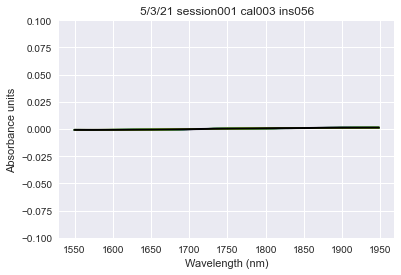

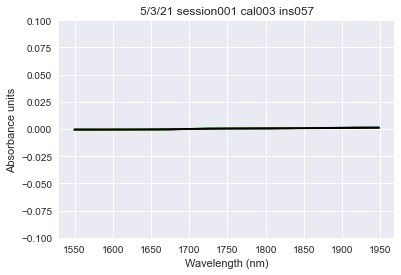

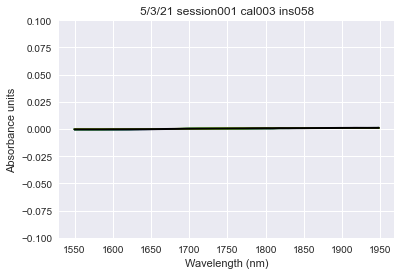

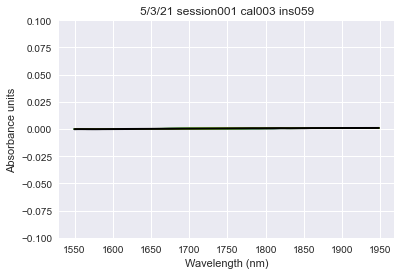

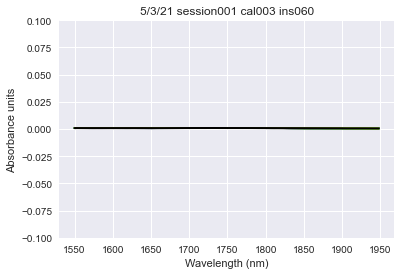

In [11]:
path_name = "/Users/linda/OneDrive/Documents/S4_mine_p/Projects/Data_collected/"

df = pd.read_csv('data/white_insertions_nirone_210502.csv')
date = '5/3/21'
session_df = df.loc[df['date'] == date].copy()

for calibration in session_df['calibration'].unique():
    small_df = session_df.loc[session_df['calibration'] == calibration].copy()
    for index in small_df.index:    
        file = construct_full_file_path(path_name, small_df['file_name'][index])
        session = small_df['session'][index]
        calibration_path = small_df['session'][index] + '/' + small_df['calibration'][index]
        insertion_path = calibration_path + '/' + small_df['insertion'][index]
        insertion = small_df['insertion'][index]
        insertion_start = get_insertion_timestamp(file, insertion_path)
        vis_waves = get_visible_wavelength_vector(file, calibration_path)
        start_index = find_position_in_wavelength_vector(vis_waves, 1550)
        end_index = find_position_in_wavelength_vector(vis_waves, 1950)
        vis_raw_spectra = get_visible_insertion_raw_spectra(file, insertion_path)
        absorbance_spectra = np.empty_like(vis_raw_spectra[:, start_index:end_index], dtype=np.double)
        vis_white_spectrum = get_visible_white_calibration_curve(file, calibration_path)[start_index:end_index]
        vis_dark_spectrum = get_visible_dark_calibration_curve(file, calibration_path)[start_index:end_index]
        fig, ax = plt.subplots()
        first_timestamp = get_visible_spectrum_timestamp(file, insertion_path, 0)
        insertion_df = pd.DataFrame()
        for i in range(vis_raw_spectra.shape[0]):
            absorbance_spectrum = savgol_filter(calculate_absorbance_from_raw(vis_raw_spectra[i, start_index:end_index], vis_white_spectrum, vis_dark_spectrum), 21, 3)
            max_absorbance = abs(absorbance_spectrum.max())
            spectrum_timestamp = get_visible_spectrum_timestamp(file, insertion_path, i)
            time_delta = spectrum_timestamp - first_timestamp
            insertion_df.loc[i, "time_delta"] = time_delta.total_seconds()
            insertion_df.loc[i, "max_absorbance"] = max_absorbance
            absorbance_spectra[i, :] = absorbance_spectrum
            color = plt.cm.viridis(normalize(i, vis_raw_spectra.shape[0], 0))
            
            ax.plot(vis_waves[start_index:end_index], absorbance_spectrum, color=color, alpha=0.2)
        ax.plot(vis_waves[start_index:end_index], absorbance_spectra.mean(axis=0), 'k', lw=2)
        ax.set_title(f'{date} {session} {calibration} {insertion}')
        ax.set_ylabel("Absorbance units")
        ax.set_xlabel("Wavelength (nm)")
        ax.set_ylim(-0.1, 0.1)
        plt.show()
        plt.close()

# NIRONE absorbance spectra, 5/2/21

Spectra were taken outside in the bright afternoon sunshine.  The light source was already warm when acquisition began.

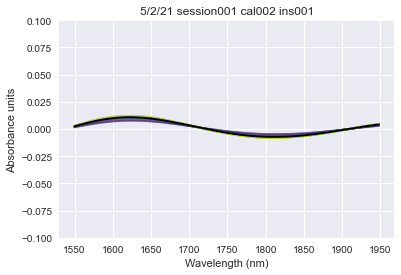

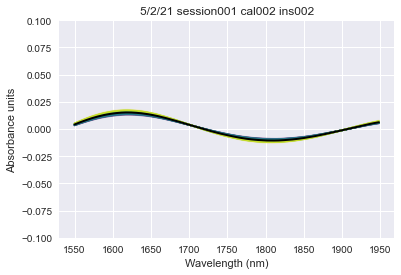

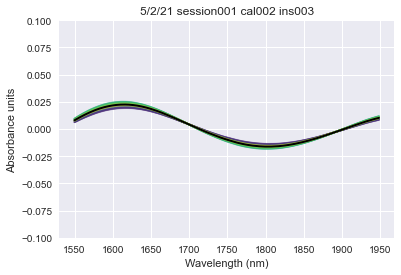

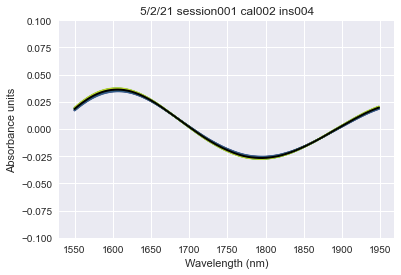

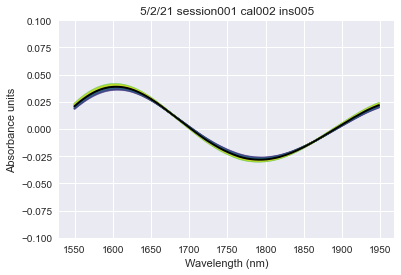

...

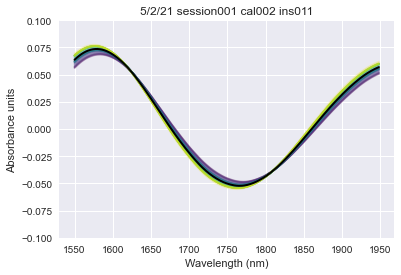

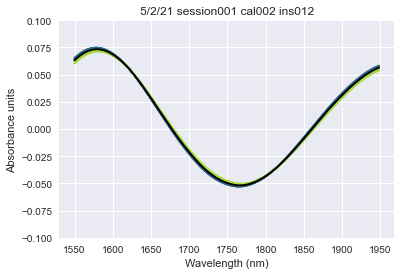

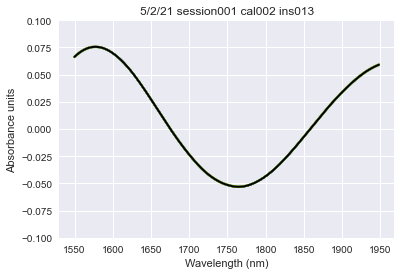

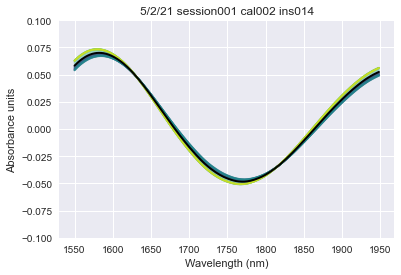

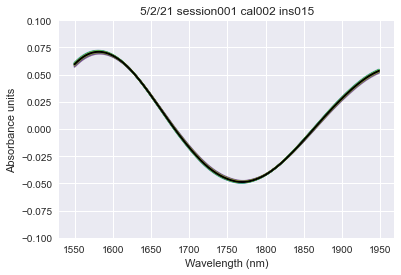

In [12]:
path_name = "/Users/linda/OneDrive/Documents/S4_mine_p/Projects/Data_collected/"

df = pd.read_csv('data/white_insertions_nirone_210502.csv')
date = '5/2/21'
session_df = df.loc[df['date'] == date].copy()

for calibration in session_df['calibration'].unique():
    small_df = session_df.loc[session_df['calibration'] == calibration].copy()
    for index in small_df.index:    
        file = construct_full_file_path(path_name, small_df['file_name'][index])
        session = small_df['session'][index]
        calibration_path = small_df['session'][index] + '/' + small_df['calibration'][index]
        insertion_path = calibration_path + '/' + small_df['insertion'][index]
        insertion = small_df['insertion'][index]
        insertion_start = get_insertion_timestamp(file, insertion_path)
        vis_waves = get_visible_wavelength_vector(file, calibration_path)
        start_index = find_position_in_wavelength_vector(vis_waves, 1550)
        end_index = find_position_in_wavelength_vector(vis_waves, 1950)
        vis_raw_spectra = get_visible_insertion_raw_spectra(file, insertion_path)
        absorbance_spectra = np.empty_like(vis_raw_spectra[:, start_index:end_index], dtype=np.double)
        vis_white_spectrum = get_visible_white_calibration_curve(file, calibration_path)[start_index:end_index]
        vis_dark_spectrum = get_visible_dark_calibration_curve(file, calibration_path)[start_index:end_index]
        fig, ax = plt.subplots()
        first_timestamp = get_visible_spectrum_timestamp(file, insertion_path, 0)
        insertion_df = pd.DataFrame()
        for i in range(vis_raw_spectra.shape[0]):
            absorbance_spectrum = savgol_filter(calculate_absorbance_from_raw(vis_raw_spectra[i, start_index:end_index], vis_white_spectrum, vis_dark_spectrum), 21, 3)
            max_absorbance = abs(absorbance_spectrum.max())
            spectrum_timestamp = get_visible_spectrum_timestamp(file, insertion_path, i)
            time_delta = spectrum_timestamp - first_timestamp
            insertion_df.loc[i, "time_delta"] = time_delta.total_seconds()
            insertion_df.loc[i, "max_absorbance"] = max_absorbance
            absorbance_spectra[i, :] = absorbance_spectrum
            color = plt.cm.viridis(normalize(i, vis_raw_spectra.shape[0], 0))
            
            ax.plot(vis_waves[start_index:end_index], absorbance_spectrum, color=color, alpha=0.2)
        ax.plot(vis_waves[start_index:end_index], absorbance_spectra.mean(axis=0), 'k', lw=2)
        ax.set_title(f'{date} {session} {calibration} {insertion}')
        ax.set_ylabel("Absorbance units")
        ax.set_xlabel("Wavelength (nm)")
        ax.set_ylim(-0.1, 0.1)
        plt.show()
        plt.close()

# NIRONE absorbance spectra, 3/30/21

Spectra were taken inside the garage.  In insersions ins006-ins008 the probe was moving during acquisition.

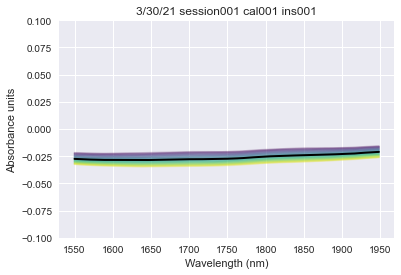

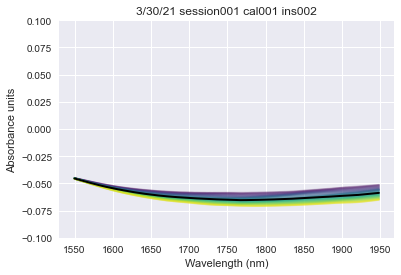

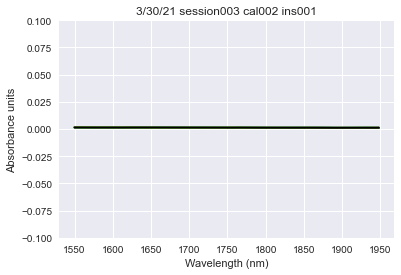

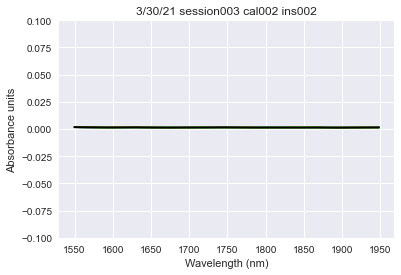

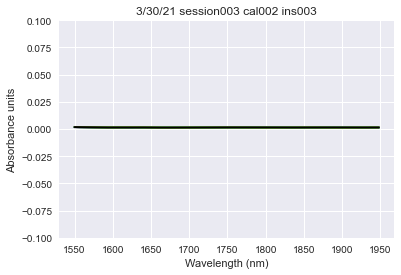

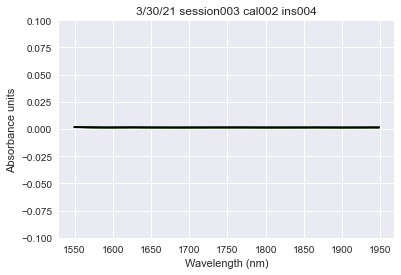

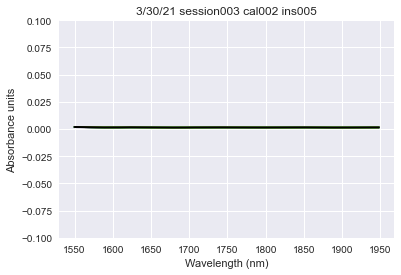

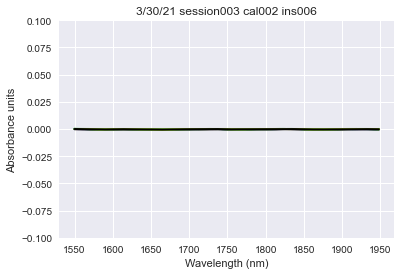

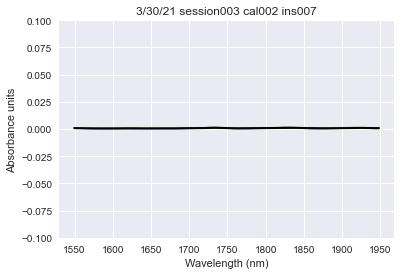

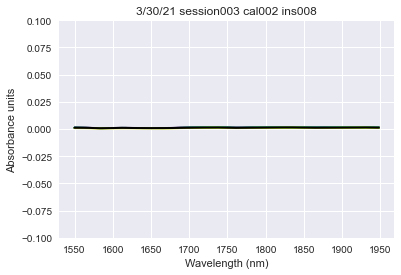

In [13]:
path_name = "/Users/linda/OneDrive/Documents/S4_mine_p/Projects/Data_collected/"

df = pd.read_csv('data/white_insertions_nirone_210502.csv')
date = '3/30/21'
session_df = df.loc[df['date'] == date].copy()

for calibration in session_df['calibration'].unique():
    small_df = session_df.loc[session_df['calibration'] == calibration].copy()
    for index in small_df.index:    
        file = construct_full_file_path(path_name, small_df['file_name'][index])
        session = small_df['session'][index]
        calibration_path = small_df['session'][index] + '/' + small_df['calibration'][index]
        insertion_path = calibration_path + '/' + small_df['insertion'][index]
        insertion = small_df['insertion'][index]
        insertion_start = get_insertion_timestamp(file, insertion_path)
        vis_waves = get_visible_wavelength_vector(file, calibration_path)
        start_index = find_position_in_wavelength_vector(vis_waves, 1550)
        end_index = find_position_in_wavelength_vector(vis_waves, 1950)
        vis_raw_spectra = get_visible_insertion_raw_spectra(file, insertion_path)
        absorbance_spectra = np.empty_like(vis_raw_spectra[:, start_index:end_index], dtype=np.double)
        vis_white_spectrum = get_visible_white_calibration_curve(file, calibration_path)[start_index:end_index]
        vis_dark_spectrum = get_visible_dark_calibration_curve(file, calibration_path)[start_index:end_index]
        fig, ax = plt.subplots()
        first_timestamp = get_visible_spectrum_timestamp(file, insertion_path, 0)
        insertion_df = pd.DataFrame()
        for i in range(vis_raw_spectra.shape[0]):
            absorbance_spectrum = savgol_filter(calculate_absorbance_from_raw(vis_raw_spectra[i, start_index:end_index], vis_white_spectrum, vis_dark_spectrum), 21, 3)
            max_absorbance = abs(absorbance_spectrum.max())
            spectrum_timestamp = get_visible_spectrum_timestamp(file, insertion_path, i)
            time_delta = spectrum_timestamp - first_timestamp
            insertion_df.loc[i, "time_delta"] = time_delta.total_seconds()
            insertion_df.loc[i, "max_absorbance"] = max_absorbance
            absorbance_spectra[i, :] = absorbance_spectrum
            color = plt.cm.viridis(normalize(i, vis_raw_spectra.shape[0], 0))
            
            ax.plot(vis_waves[start_index:end_index], absorbance_spectrum, color=color, alpha=0.2)
        ax.plot(vis_waves[start_index:end_index], absorbance_spectra.mean(axis=0), 'k', lw=2)
        ax.set_title(f'{date} {session} {calibration} {insertion}')
        ax.set_ylabel("Absorbance units")
        ax.set_xlabel("Wavelength (nm)")
        ax.set_ylim(-0.1, 0.1)
        plt.show()
        plt.close()

# NIRONE absorbance spectra, 4/10/21

Spectra were taken inside the garage.  During many of these insertions, the probe was moving during the acquisition.

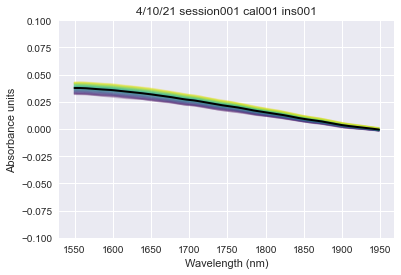

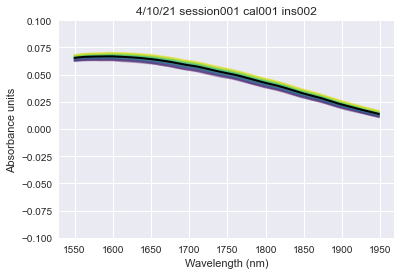

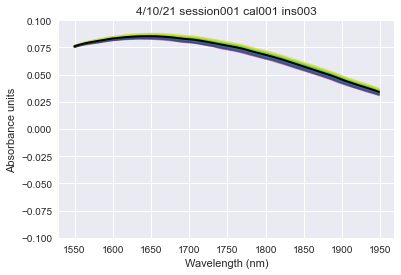

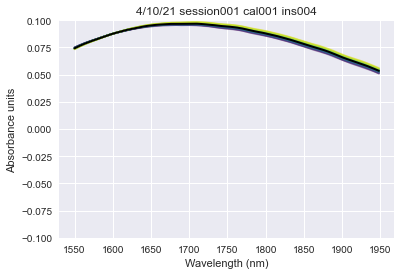

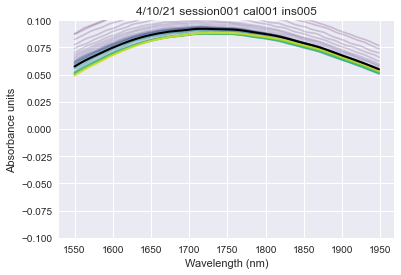

...

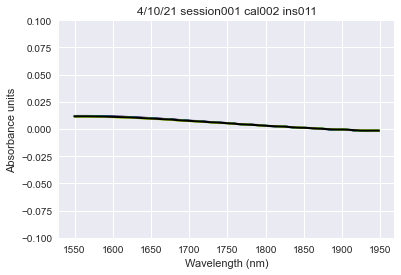

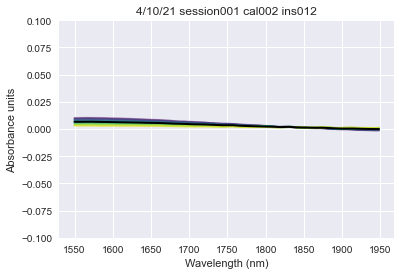

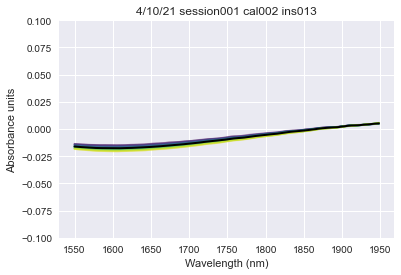

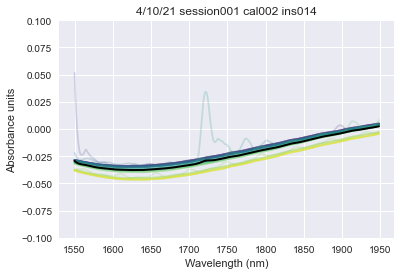

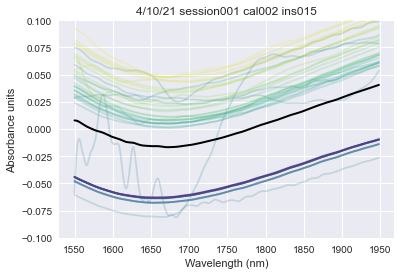

In [14]:
path_name = "/Users/linda/OneDrive/Documents/S4_mine_p/Projects/Data_collected/"

df = pd.read_csv('data/white_insertions_nirone_210502.csv')
date = '4/10/21'
session_df = df.loc[df['date'] == date].copy()

for calibration in session_df['calibration'].unique():
    small_df = session_df.loc[session_df['calibration'] == calibration].copy()
    for index in small_df.index:    
        file = construct_full_file_path(path_name, small_df['file_name'][index])
        session = small_df['session'][index]
        calibration_path = small_df['session'][index] + '/' + small_df['calibration'][index]
        insertion_path = calibration_path + '/' + small_df['insertion'][index]
        insertion = small_df['insertion'][index]
        insertion_start = get_insertion_timestamp(file, insertion_path)
        vis_waves = get_visible_wavelength_vector(file, calibration_path)
        start_index = find_position_in_wavelength_vector(vis_waves, 1550)
        end_index = find_position_in_wavelength_vector(vis_waves, 1950)
        vis_raw_spectra = get_visible_insertion_raw_spectra(file, insertion_path)
        absorbance_spectra = np.empty_like(vis_raw_spectra[:, start_index:end_index], dtype=np.double)
        vis_white_spectrum = get_visible_white_calibration_curve(file, calibration_path)[start_index:end_index]
        vis_dark_spectrum = get_visible_dark_calibration_curve(file, calibration_path)[start_index:end_index]
        fig, ax = plt.subplots()
        first_timestamp = get_visible_spectrum_timestamp(file, insertion_path, 0)
        insertion_df = pd.DataFrame()
        for i in range(vis_raw_spectra.shape[0]):
            absorbance_spectrum = savgol_filter(calculate_absorbance_from_raw(vis_raw_spectra[i, start_index:end_index], vis_white_spectrum, vis_dark_spectrum), 21, 3)
            max_absorbance = abs(absorbance_spectrum.max())
            spectrum_timestamp = get_visible_spectrum_timestamp(file, insertion_path, i)
            time_delta = spectrum_timestamp - first_timestamp
            insertion_df.loc[i, "time_delta"] = time_delta.total_seconds()
            insertion_df.loc[i, "max_absorbance"] = max_absorbance
            absorbance_spectra[i, :] = absorbance_spectrum
            color = plt.cm.viridis(normalize(i, vis_raw_spectra.shape[0], 0))
            
            ax.plot(vis_waves[start_index:end_index], absorbance_spectrum, color=color, alpha=0.2)
        ax.plot(vis_waves[start_index:end_index], absorbance_spectra.mean(axis=0), 'k', lw=2)
        ax.set_title(f'{date} {session} {calibration} {insertion}')
        ax.set_ylabel("Absorbance units")
        ax.set_xlabel("Wavelength (nm)")
        ax.set_ylim(-0.1, 0.1)
        plt.show()
        plt.close()